### URLs for Datasets used in this assignment

In [14]:
# Gapminder dataset: prebuilt in plotly and also shared on Kaggle:

# Earthquake dataset: https://raw.githubusercontent.com/plotly/datasets/master/earthquakes-23k.csv

#  World Bank dataset titled, 'Poverty and Equity Database' : https://databank.worldbank.org/data/download/PovStats_csv.zip

# World Cities Dataset: https://gist.githubusercontent.com/curran/13d30e855d48cdd6f22acdf0afe27286/raw/0635f14817ec634833bb904a47594cc2f5f9dbf8/worldcities_clean.csv

# Mt. Bruno Surface Dataset: https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv

# Tips smoker gender dataset: https://www.kaggle.com/sanjanabasu/tips-dataset/data?select=tips.csv 

# AirBnB in Berlin : https://www.kaggle.com/brittabettendorf/berlin-airbnb-data

# Iris dataset: https://www.kaggle.com/uciml/iris

# gapminder = px.data.gapminder()  #loading data from Plotly express  - built in

# df_exp = px.data.experiment() - built-in dataset

# MRI Images: https://s3.amazonaws.com/assets.datacamp.com/blog_assets/attention-mri.tif

# Wind Direction and Frequency Data: df_winddata = px.data.wind()    (Built-in)

## Basics to Keep - Imports

In [3]:
# Import libraries we will be using
# !pip install alpha-vantage
import numpy as np
import pandas as pd
import numpy as np     # used for data analysis functionalities
import pandas as pd
import matplotlib
from matplotlib import rc
from mpl_toolkits.mplot3d import Axes3D
# from skimage import io
#import plotly
#plotly.offline.init_notebook_mode()
#import plotly as py
import plotly as py
from sklearn.datasets import fetch_olivetti_faces
#import chart_studio.plotly as py
import plotly.graph_objs as go    # for setting graphs, plots, charts
import matplotlib.pyplot as plt    # matplotlib is imported for plotting
import ipywidgets as widgets  # Since we're using widgets
from scipy import special                  # since we're using Bessel functions (bassel functions are special functions)
import seaborn as sns             # for visualizing 
import scipy.special as spl
import dash
from dash import dcc as dcc
import dash_html_components as html
from dash.dependencies import Output, Input
# import dash_bootstrap_components as dbc
import plotly.figure_factory as ff
from plotly.offline import iplot
from IPython.display import YouTubeVideo 
import plotly.graph_objects as go
import urllib, json
import json

from alpha_vantage.timeseries import TimeSeries

%matplotlib inline                 
# the last command tells jupyter to plot all of plots within the Jupyter NB

# Import all required functions and classes from Plotly
import plotly.express as px
#import plotly.offline as pltt   
#chart_studio.plotly.offline.init_notebook_mode(connected = True) # setting up offline mode - as opposed to online mode, 
#since plotly is a service that you can share your vizes online thru

#Below we want our graphs to be plotted in offline mode so...
py.offline.init_notebook_mode(connected=True)

import plotly.graph_objs as go
from plotly.figure_factory import create_table

In [16]:
gapminder = px.data.gapminder()  #loading data from Plotly express  - built in

In [17]:
df_iris = px.data.iris() #defining dataset for later use

In [18]:
df_gapminder = pd.read_csv("gapminder_data.csv")   #defining early to use later
print(df_gapminder)

                country  incomeperperson  alcconsumption  armedforcesrate  \
0           Afghanistan              NaN            0.03         0.569653   
1               Albania      1914.996551            7.29         1.024736   
2               Algeria      2231.993335            0.69         2.306817   
3               Andorra     21943.339900           10.17              NaN   
4                Angola      1381.004268            5.57         1.461329   
..                  ...              ...             ...              ...   
208             Vietnam       722.807559            3.91         1.085367   
209  West Bank and Gaza              NaN             NaN         5.936085   
210         Yemen, Rep.       610.357367            0.20         2.316235   
211              Zambia       432.226337            3.56         0.341335   
212            Zimbabwe       320.771890            4.96         1.032785   

     breastcancerper100th  co2emissions  femaleemployrate  hivrate  \
0    

## Plot Controls & IPython widgets - Bessel Functions' Plot with Ipython Widgets

In [21]:
# In this graph, you'll get a mouse-over (hover) values (x and y-values)
# you'll get a legend (by default), you can click on legend to select and deselect plots
# you can select parts of graph to zoom-in
# you'll get a toolset on the top-right

x = np.linspace(0, np.pi, 500)   #Creating an X variable, with 500 points

#labels below. Layout = Title, yaxis is y-axis label, xaxis is x-axis label, but xaxis and yaxis have to be in dictionary
# so we use dict() with each: the xaxis and yaxis

# we create our 1st trace, 

layout = go.Layout(
    title='<b>BESSEL FUNCTIONS PLOT</b>',
    yaxis=dict(
        title='<i>(in Power units)</i>'
    ),
    xaxis=dict(
        title='<i>(in time units)</i>'
    )
)


def change_plot(signals, freq):    #Define function with two parameters
    
    """
    This will modify the plot whenever widget changes
    """

    data = []    #empty list called, data to place our traces in 
    for signal in signals:                 # signals is items in multi-select widget
        trace1 = go.Scatter(
            x=x,
            y=spl.jv(signal, freq * x),        #scipy.special.jv(v, z) = <ufunc 'jv'>   #j is the symbol of the bessel function
            mode='lines',                      #no markers since there are 500 points, would be too cluttered
            name='bessel line {}'.format(signal),
            line=dict(
                shape='spline'   # hv = staircase-ish lines, sorta-pixelated
            )
        )
        data.append(trace1)

    fig = go.Figure(data=data, layout=layout)
    py.offline.iplot(fig)
    
#3 widget's section below 
signals = widgets.SelectMultiple(options=list(range(8)), value=(0, ), description='Bessel No.')
freq = widgets.FloatSlider(min=1, max=20, value=1, description='Frequency')
widgets.interactive(change_plot, signals=signals, freq=freq)

# you can rescale by dragging y-axis up or down, or by dragging x-axis right or left
# it's multi-select so you can select more than one trace
# you get multi-hovers, several hovers (one per trace)

interactive(children=(SelectMultiple(description='Bessel No.', index=(0,), options=(0, 1, 2, 3, 4, 5, 6, 7), v…

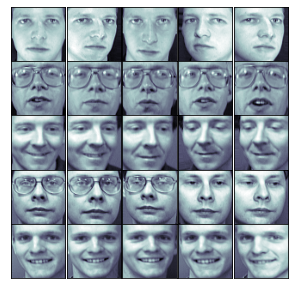

In [22]:
fig,ax=plt.subplots(5,5,figsize=(5,5))
fig.subplots_adjust(hspace=0,wspace=0)

# Through scikitlearn, we are importing face-data - sounds crude

from sklearn.datasets import fetch_olivetti_faces
faces = fetch_olivetti_faces().images

for i in range(5):
    for j in range(5):
        ax[i, j].xaxis.set_major_locator(plt.NullLocator())
        ax[i, j].yaxis.set_major_locator(plt.NullLocator())
        ax[i, j].imshow(faces[10 * i + j], cmap="bone")

### Testing various markers

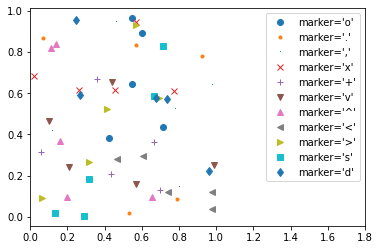

In [4]:
rng = np.random.RandomState(0)
for marker in ['o', '.', ',', 'x', '+', 'v', '^', '<', '>', 's', 'd']:
    plt.plot(rng.rand(5), rng.rand(5), marker,label="marker='{0}'".format(marker))

plt.legend(numpoints=1)
plt.xlim(0, 1.8);

C:\Users\S\AppData\Local\Temp/ipykernel_22472/1019466303.py:20: UserWarning:

The following kwargs were not used by contour: 'color'



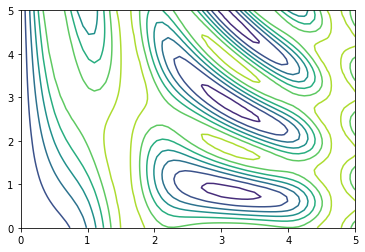

In [24]:
# Visualizing a Three-Dimensional Function


# function formula used is z = f (x, y)

def f(x,y):
    return np.sin(x)**10+np.cos(10+y*x)*np.cos(x)
 

x=np.linspace(0,5,60)
y=np.linspace(0,5,50)

# np.meshgrid function, generates a 2-D grids from 1-D arrays

X,Y=np.meshgrid(x,y)
Z=f(X,Y)

#plotting contour plot below 

plt.contour(X,Y,Z,color='black')

# black 'n' white is default since 1 color is used, negative values are shown as dashed-lines, 
# meanwhile positive values are shown as solid lines

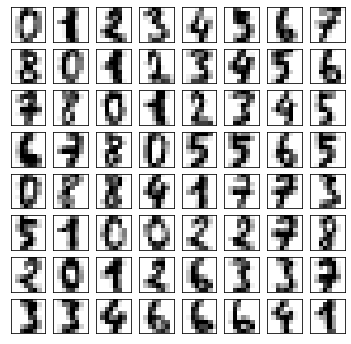

In [25]:
# Generating Handwritten Numbers 

# numbers from 0 till 8

from sklearn.datasets import load_digits
digits=load_digits(n_class=9)

fig,ax=plt.subplots(8,8,figsize=(6, 6))
for i, axi in enumerate(ax.flat):
     axi.imshow(digits.images[i], cmap='binary')
     axi.set(xticks=[], yticks=[])

In [26]:
# for a sankey diagram we import (at the top) the following:
# import plotly.graph_objects as go
# import urllib, json

url = 'https://raw.githubusercontent.com/plotly/plotly.js/master/test/image/mocks/sankey_energy.json'
response = urllib.request.urlopen(url)
data = json.loads(response.read())

# override gray link colors with 'source' colors
opacity = 0.4
# change 'magenta' to its 'rgba' value to add opacity
data['data'][0]['node']['color'] = ['rgba(255,0,255, 0.8)' if color == "magenta" else color for color in data['data'][0]['node']['color']]
data['data'][0]['link']['color'] = [data['data'][0]['node']['color'][src].replace("0.8", str(opacity))
                                    for src in data['data'][0]['link']['source']]

fig = go.Figure(data=[go.Sankey(
    valueformat = ".0f",
    valuesuffix = "TWh",
    # Define nodes
    node = dict(
      pad = 15,
      thickness = 15,
      line = dict(color = "black", width = 0.5),
      label =  data['data'][0]['node']['label'],
      color =  data['data'][0]['node']['color']
    ),
    # Add links
    link = dict(
      source =  data['data'][0]['link']['source'],
      target =  data['data'][0]['link']['target'],
      value =  data['data'][0]['link']['value'],
      label =  data['data'][0]['link']['label'],
      color =  data['data'][0]['link']['color']
))])

fig.update_layout(title_text="Energy forecast for 2050<br>Source: Department of Energy & Climate Change, Tom Counsell via <a href='https://bost.ocks.org/mike/sankey/'>Mike Bostock</a>",
                  font_size=10)
fig.show()

In [27]:
# parallel_categories
df_tips = pd.read_csv("tips.csv")
fig = px.parallel_categories(df_tips, dimensions=['sex', 'smoker', 'day'],
                color="size", color_continuous_scale=px.colors.sequential.Sunset,
                labels={'sex':'Gender of Customer', 'smoker':'Customer is  Smoker', 'day':'Weekday'})
fig.show()

### Using Stock Data to generate two line charts

In [28]:
import plotly.graph_objects as go

df_stocks = px.data.stocks()
px.line(df_stocks, x='date', y='GOOG', labels={'x':'Date', 'y':'Price'})


px.line(df_stocks, x='date', y=['GOOG','AAPL'], labels={'x':'Date', 'y':'Price'},
       title='Apple Vs. Google')


fig = go.Figure()

fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL, 
                        mode='lines', name='Apple'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN, 
                        mode='lines+markers', name='Amazon'))

fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG, 
                        mode='lines+markers', name='Google',
                        line=dict(color='firebrick', width=2, dash='dashdot')))


fig.update_layout(
     
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
     
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=False,
    ),
    autosize=False,
    margin=dict(
        autoexpand=False,
        l=100,
        r=20,
        t=110,
    ),
    showlegend=False,
    plot_bgcolor='white'
)

### Using Stock Data to generate two boxplots with scatterplots

In [29]:
df_tips = px.data.tips()

px.box(df_tips, x='sex', y='tip', points='all')


px.box(df_tips, x='day', y='tip', color='sex')


fig = go.Figure()
fig.add_trace(go.Box(x=df_tips.sex, y=df_tips.tip, marker_color='blue',
                    boxmean='sd'))


df_stocks = px.data.stocks()
fig = go.Figure()

fig.add_trace(go.Box(y=df_stocks.GOOG, boxpoints='all', name='Google',
                    fillcolor='blue', jitter=0.5, whiskerwidth=0.2))
fig.add_trace(go.Box(y=df_stocks.AAPL, boxpoints='all', name='Apple',
                    fillcolor='red', jitter=0.5, whiskerwidth=0.2))

fig.update_layout(title='Google vs. Apple', 
                  yaxis=dict(gridcolor='rgb(255, 255, 255)',
                 gridwidth=3),
                 paper_bgcolor='rgb(243, 243, 243)',
                 plot_bgcolor='rgb(243, 243, 243)')

## Exploring the Gapminder Dataset

In [30]:
gapminder.head()  #viewing top 5 rows of dataset to get idea of dataset

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4


In [31]:
# checking dimensions of dataset
gapminder.shape

(1704, 8)

In [32]:
# to simply view our columns
gapminder.columns

Index(['country', 'continent', 'year', 'lifeExp', 'pop', 'gdpPercap',
       'iso_alpha', 'iso_num'],
      dtype='object')

In [33]:
country_data = px.data.gapminder()
print(country_data)

          country continent  year  lifeExp       pop   gdpPercap iso_alpha  \
0     Afghanistan      Asia  1952   28.801   8425333  779.445314       AFG   
1     Afghanistan      Asia  1957   30.332   9240934  820.853030       AFG   
2     Afghanistan      Asia  1962   31.997  10267083  853.100710       AFG   
3     Afghanistan      Asia  1967   34.020  11537966  836.197138       AFG   
4     Afghanistan      Asia  1972   36.088  13079460  739.981106       AFG   
...           ...       ...   ...      ...       ...         ...       ...   
1699     Zimbabwe    Africa  1987   62.351   9216418  706.157306       ZWE   
1700     Zimbabwe    Africa  1992   60.377  10704340  693.420786       ZWE   
1701     Zimbabwe    Africa  1997   46.809  11404948  792.449960       ZWE   
1702     Zimbabwe    Africa  2002   39.989  11926563  672.038623       ZWE   
1703     Zimbabwe    Africa  2007   43.487  12311143  469.709298       ZWE   

      iso_num  
0           4  
1           4  
2           4  

In [34]:
# to view number of non-null values per field and data type per field we will use .info()
gapminder.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1704 entries, 0 to 1703
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   country    1704 non-null   object 
 1   continent  1704 non-null   object 
 2   year       1704 non-null   int64  
 3   lifeExp    1704 non-null   float64
 4   pop        1704 non-null   int64  
 5   gdpPercap  1704 non-null   float64
 6   iso_alpha  1704 non-null   object 
 7   iso_num    1704 non-null   int64  
dtypes: float64(2), int64(3), object(3)
memory usage: 106.6+ KB


In [35]:
# Show summary statistics of the data
gapminder.describe()

,year,lifeExp,pop,gdpPercap,iso_num
count,1704.00000,1704.000000,1.704000e+03,1704.000000,1704.000000
mean,1979.50000,59.474439,2.960121e+07,7215.327081,425.880282
std,17.26533,12.917107,1.061579e+08,9857.454543,248.305709
min,1952.00000,23.599000,6.001100e+04,241.165876,4.000000
25%,1965.75000,48.198000,2.793664e+06,1202.060309,208.000000
50%,1979.50000,60.712500,7.023596e+06,3531.846989,410.000000
75%,1993.25000,70.845500,1.958522e+07,9325.462346,638.000000
max,2007.00000,82.603000,1.318683e+09,113523.132900,894.000000


In [36]:
# Checking how many times a country was counted
gapminder["country"].value_counts()

Afghanistan          12
Pakistan             12
New Zealand          12
Nicaragua            12
Niger                12
                     ..
Eritrea              12
Equatorial Guinea    12
El Salvador          12
Egypt                12
Zimbabwe             12
Name: country, Length: 142, dtype: int64

In [37]:
gapminder["continent"].value_counts()
#for Africa we have 624 records ...etc.

Africa      624
Asia        396
Europe      360
Americas    300
Oceania      24
Name: continent, dtype: int64

In [38]:
# Checking how many continents are there as well as how many countries (unique values)
gapminder['country'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Angola', 'Argentina',
       'Australia', 'Austria', 'Bahrain', 'Bangladesh', 'Belgium',
       'Benin', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'Bulgaria', 'Burkina Faso', 'Burundi', 'Cambodia', 'Cameroon',
       'Canada', 'Central African Republic', 'Chad', 'Chile', 'China',
       'Colombia', 'Comoros', 'Congo, Dem. Rep.', 'Congo, Rep.',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Czech Republic',
       'Denmark', 'Djibouti', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Ethiopia',
       'Finland', 'France', 'Gabon', 'Gambia', 'Germany', 'Ghana',
       'Greece', 'Guatemala', 'Guinea', 'Guinea-Bissau', 'Haiti',
       'Honduras', 'Hong Kong, China', 'Hungary', 'Iceland', 'India',
       'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Israel', 'Italy',
       'Jamaica', 'Japan', 'Jordan', 'Kenya', 'Korea, Dem. Rep.',
       'Korea, Rep.', 'Kuwait', 'Leba

## Create a Table

In [39]:
# Now to convert data into a nice Table format
create_table(gapminder.head(15))
#this create_table function is imported from plotly.figure_factory
# Do not try loading the whole dataset into a table like, create_table(gapminder) - most of the times it crashes

## Subquery Gapminder dataset to show only Canada-related data

In [40]:
# We will visualize data related Canada instead of the whole Gapminder dataset
# Query about country  and use double-equal to assign country we're querying about
canada_data = px.data.gapminder().query(" country == 'Canada' ")
print(canada_data)

# Now we can only see data of Canada 

    country continent  year  lifeExp       pop    gdpPercap iso_alpha  iso_num
240  Canada  Americas  1952   68.750  14785584  11367.16112       CAN      124
241  Canada  Americas  1957   69.960  17010154  12489.95006       CAN      124
242  Canada  Americas  1962   71.300  18985849  13462.48555       CAN      124
243  Canada  Americas  1967   72.130  20819767  16076.58803       CAN      124
244  Canada  Americas  1972   72.880  22284500  18970.57086       CAN      124
245  Canada  Americas  1977   74.210  23796400  22090.88306       CAN      124
246  Canada  Americas  1982   75.760  25201900  22898.79214       CAN      124
247  Canada  Americas  1987   76.860  26549700  26626.51503       CAN      124
248  Canada  Americas  1992   77.950  28523502  26342.88426       CAN      124
249  Canada  Americas  1997   78.610  30305843  28954.92589       CAN      124
250  Canada  Americas  2002   79.770  31902268  33328.96507       CAN      124
251  Canada  Americas  2007   80.653  33390141  3631

## Plotting Inline

### (animated and not-animted) Barcharts and Histograms

In [41]:
gapminder = px.data.gapminder()  #Don't comment out please
px.bar(gapminder, x="country", y="lifeExp")

In [42]:
# Plot histogram based randomly-generating the results of rolling 2 dices
dice_1 = np.random.randint(1,7,1000)
dice_2 = np.random.randint(1,7,1000)
dice_total = dice_1 + dice_2
# bins = number of bars
# defining x, color and label

fig = px.histogram(dice_total, nbins=11, labels={'value':'Dice Roll'},
             title='5000 Dice Roll Histogram', marginal='violin',
            color_discrete_sequence=['green'])

fig.update_layout(
    xaxis_title_text='Dice-Roll',
    yaxis_title_text='Dice-Total',
    bargap=0.2, showlegend=False
)

# Here we are stacking two histograms ontop of each other
df_tips = px.data.tips()
px.histogram(df_tips, x="total_bill", color="sex")

In [43]:
# Simple Histogram
df = px.data.gapminder().query("year == 2007")
# Here we use a column with categorical data
fig = px.histogram(df, x="gdpPercap")
fig.show()

In [44]:
# Simple Bar chart with Portugal Query
data_portugal = px.data.gapminder().query("country == 'Portugal'")
fig = px.bar(data_portugal, x='year', y='pop')
fig.show()

In [45]:
px.bar(canada_data, x= 'year', y='pop', 
       color = 'lifeExp', 
       height = 400, 
       labels= {'pop':'popuation'} )


### Line Charts

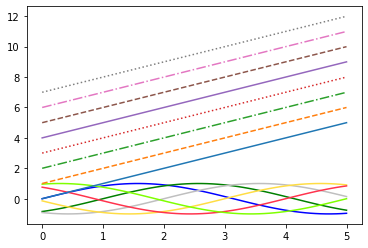

In [46]:
# Adjusting the Plot: Line Colors and Styles

# The first adjustment you might wish to make to a plot is to control the line colors and styles. The plt.plot() function takes additional arguments that can be used to spec‐
# ify these. To adjust the color, you can use the color keyword, which accepts a string argument representing virtually any imaginable color. The color can be specified in a variety of ways


plt.plot(x, np.sin(x - 0), color='blue')      # specify color by name
plt.plot(x, np.sin(x - 1), color='g')        # short color code (rgbcmyk)
plt.plot(x, np.sin(x - 2), color='0.75')     # Grayscale between 0 and 1
plt.plot(x, np.sin(x - 3), color='#FFDD44')      # Hex code (RRGGBB from 00 to FF)
plt.plot(x, np.sin(x - 4), color=(1.0,0.2,0.3))    # RGB tuple, values 0 and 1
plt.plot(x, np.sin(x - 5), color='chartreuse');     # all HTML color names supported

# If no color is specified, Matplotlib will automatically cycle through a set of default colors for multiple lines.

# Similarly, you can adjust the line style using the linestyle keyword

plt.plot(x, x + 0, linestyle='solid')
plt.plot(x, x + 1, linestyle='dashed')
plt.plot(x, x + 2, linestyle='dashdot')
plt.plot(x, x + 3, linestyle='dotted')
    
 # For short, you can use the following codes:

plt.plot(x, x + 4, linestyle='-') # solid
plt.plot(x, x + 5, linestyle='--') # dashed
plt.plot(x, x + 6, linestyle='-.') # dashdot
plt.plot(x, x + 7, linestyle=':') # dotted

In [47]:
df_tips = px.data.tips()
print(df_tips)

     total_bill   tip     sex smoker   day    time  size
0         16.99  1.01  Female     No   Sun  Dinner     2
1         10.34  1.66    Male     No   Sun  Dinner     3
2         21.01  3.50    Male     No   Sun  Dinner     3
3         23.68  3.31    Male     No   Sun  Dinner     2
4         24.59  3.61  Female     No   Sun  Dinner     4
..          ...   ...     ...    ...   ...     ...   ...
239       29.03  5.92    Male     No   Sat  Dinner     3
240       27.18  2.00  Female    Yes   Sat  Dinner     2
241       22.67  2.00    Male    Yes   Sat  Dinner     2
242       17.82  1.75    Male     No   Sat  Dinner     2
243       18.78  3.00  Female     No  Thur  Dinner     2

[244 rows x 7 columns]


In [48]:
# Several scatterplots are sometimes called, 'Facets'
df_tips = px.data.tips()  #smoker tip df
px.scatter(df_tips, x="total_bill", y="tip", color="smoker", facet_col="sex")

# Setting plots into rows and columns
px.histogram(df_tips, x="total_bill", y="tip", color="sex", facet_row="time", facet_col="day",
       category_orders={"day": ["Thur", "Fri", "Sat", "Sun", "Mon"], "time": ["Breakfast", "Lunch", "Dinner"]})


att_df = sns.load_dataset("attention")
fig = px.line(att_df, x='solutions', y='score', facet_col='subject',
             facet_col_wrap=5, title='Scores Based on Attention')
fig

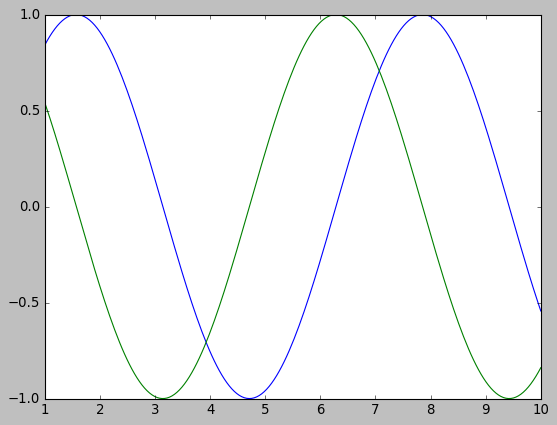

In [49]:
plt.style.use('classic')

x = np.linspace(1,10,200)
plt.plot(x,np.sin(x))
plt.plot(x,np.cos(x))
plt.show()  
# plt.show() a loop, 
# it will seek all currently active (graphic) items,
# and will open interactive window(s) that showcase your figure(s)

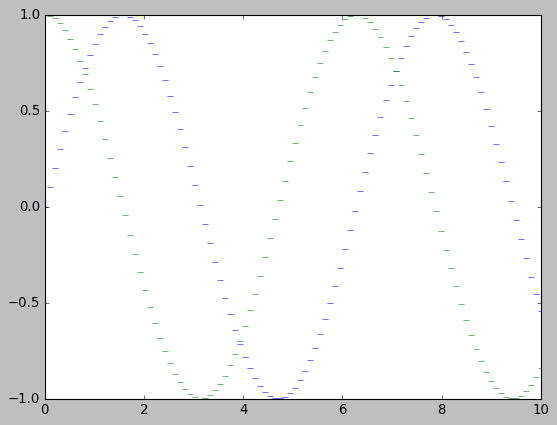

In [50]:
x = np.linspace(0, 10, 100)
fig=plt.figure()
plt.plot(x,np.sin(x),'_')
plt.plot(x,np.cos(x), '_')

fig.savefig('saved_figure.png')

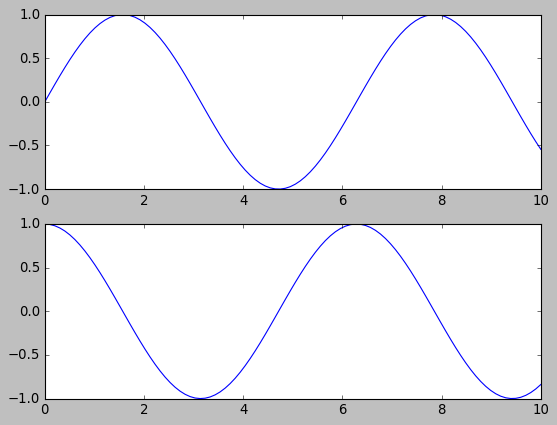

In [51]:
# one more way to draw graph

plt.figure()

# create the first of two panels and set current axis

plt.subplot(2,1,1) # (rows, columns, panel number)
plt.plot(x, np.sin(x))

# create the second panel and set current axis

plt.subplot(2,1,2)
plt.plot(x, np.cos(x))

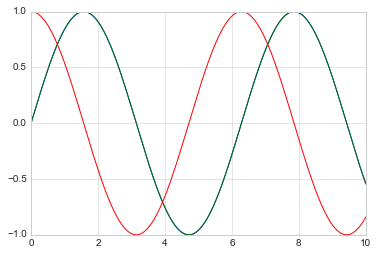

In [52]:
# Line Plots

%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import numpy as np


fig=plt.figure()
ax=plt.axis()

x=np.linspace(1,10,1000)

x = np.linspace(0, 10, 2000)
plt.plot(x, np.sin(x))

plt.plot(x, np.sin(x))
plt.plot(x, np.cos(x))
# plt.plot(x, np.tan(x))

In [53]:
# Line Plot
df = px.data.gapminder().query("country=='Lebanon'")
fig = px.line(df, x="year", y="lifeExp", title='Life expectancy in Lebanon')
fig.show()

## Plotting Interactive Maps

### Airbnb in Berlin Map Locations

In [54]:
df_AirBerlin = pd.read_csv("listings.csv")
print(df_AirBerlin)

             id                                               name    host_id  \
0          2015   Berlin-Mitte Value! Quiet courtyard/very central       2217   
1          2695                 Prenzlauer Berg close to Mauerpark       2986   
2          3176                    Fabulous Flat in great Location       3718   
3          3309                  BerlinSpot Schöneberg near KaDeWe       4108   
4          7071                   BrightRoom with sunny greenview!      17391   
...         ...                                                ...        ...   
22547  29856708       Cozy Apartment right in the center of Berlin   87555909   
22548  29857108             Altbau/ Schöneberger Kiez / Schlafsofa   67537363   
22549  29864272   Artists loft with garden in the center of Berlin    3146923   
22550  29866805              Room for two with private shower / WC   36961901   
22551  29867352  Sunny, modern and cozy flat in Berlin Neukölln :)  177464875   

        host_name     neigh

### Airbnb Berlin Locations Map - Using Latitude and Longitude coordinates

In [98]:
fig = px.density_mapbox(df_AirBerlin, lat = "latitude", lon ="longitude", z = "price", radius = 10, 
                       center = dict(lat = 9, lon =8), zoom = 1, hover_name = 'price', 
                       mapbox_style = 'open-street-map', title = 'Airbnb in Berlin Locations and Prices')

fig.show()

In [56]:
# we will use the geo scatterplot
# to learn about the scatter geo
help(px.scatter_geo)

Help on function scatter_geo in module plotly.express._chart_types:

scatter_geo(data_frame=None, lat=None, lon=None, locations=None, locationmode=None, geojson=None, featureidkey=None, color=None, text=None, symbol=None, facet_row=None, facet_col=None, facet_col_wrap=0, facet_row_spacing=None, facet_col_spacing=None, hover_name=None, hover_data=None, custom_data=None, size=None, animation_frame=None, animation_group=None, category_orders=None, labels=None, color_discrete_sequence=None, color_discrete_map=None, color_continuous_scale=None, range_color=None, color_continuous_midpoint=None, symbol_sequence=None, symbol_map=None, opacity=None, size_max=None, projection=None, scope=None, center=None, fitbounds=None, basemap_visible=None, title=None, template=None, width=None, height=None)
        In a geographic scatter plot, each row of `data_frame` is represented
        by a symbol mark on a map.
        
    Parameters
    ----------
    data_frame: DataFrame or array-like or dict
    

In [104]:
# World Cities' Populations

import pandas as pd
us_cities = pd.read_csv("https://gist.githubusercontent.com/curran/13d30e855d48cdd6f22acdf0afe27286/raw/0635f14817ec634833bb904a47594cc2f5f9dbf8/worldcities_clean.csv")

import plotly.express as px

fig = px.scatter_mapbox(us_cities, lat="lat", lon="lng", hover_name="city", hover_data=["country", "city", "population"],
                        color_discrete_sequence=["orange"], zoom=3, height=300)
fig.update_layout(
    mapbox_style="white-bg",
    mapbox_layers=[
        {
            "below": 'traces',
            "sourcetype": "raster",
            "sourceattribution": "United States Geological Survey",
            "source": [
                "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
            ]
        }
      ])
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [58]:
# creating a dataframe for earthquake dataset
# we will use .head() to view the first 5 rows

earthquake_df = pd.read_csv("earthquakes-23k.csv")
earthquake_df.head()

,Date,Latitude,Longitude,Magnitude
0,01/02/1965,19.246,145.616,6.0
1,01/04/1965,1.863,127.352,5.8
2,01/05/1965,-20.579,-173.972,6.2
3,01/08/1965,-59.076,-23.557,5.8
4,01/09/1965,11.938,126.427,5.8


In [59]:
# I want to see additional info on density_mapbox()
help(px.density_mapbox)

Help on function density_mapbox in module plotly.express._chart_types:

density_mapbox(data_frame=None, lat=None, lon=None, z=None, hover_name=None, hover_data=None, custom_data=None, animation_frame=None, animation_group=None, category_orders=None, labels=None, color_continuous_scale=None, range_color=None, color_continuous_midpoint=None, opacity=None, zoom=8, center=None, mapbox_style=None, radius=None, title=None, template=None, width=None, height=None)
        In a Mapbox density map, each row of `data_frame` contributes to the intensity of
        the color of the region around the corresponding point on the map
        
    Parameters
    ----------
    data_frame: DataFrame or array-like or dict
        This argument needs to be passed for column names (and not keyword
        names) to be used. Array-like and dict are tranformed internally to a
        pandas DataFrame. Optional: if missing, a DataFrame gets constructed
        under the hood using the other arguments.
    lat:

### Density Mapbox to Plot Earthquake Data

In [60]:
# Now to use the density_mapbox
# lat = y-axis, long = x-axis, magnitide = z-axis
# you can animate it by adding: animation_frame = 'Date' - However, don't 'cause it's set by date not year 
# so it will be heavy

fig = px.density_mapbox(earthquake_df, lat = "Latitude", lon ="Longitude", z = "Magnitude", radius = 10, 
                       center = dict(lat = 9, lon =8), zoom = 1, hover_name = 'Date', 
                       mapbox_style = 'stamen-watercolor', title = 'Earthquakes Years: 1965 to 2016')

fig.show()

#Notice you can drag the map right 'n' left, up 'n' down
# you can click the shutter camera icon to download images
# you can clikc the plus and minus buttons to zoom-in or out
# When you hover, you can see the magnitude of teh Earthquake
# in the help() result above you can see other mapbox styles like open-street-map (kinda of Google Maps - like)

### Nuclear Waste Map with Token

In [86]:
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()
import chart_studio.plotly as py
import plotly.graph_objects as go

import pandas as pd

mapbox_access_token = "pk.eyJ1IjoibWFobW91ZHlhZ2htb3VyIiwiYSI6ImNrejl3aHN6dDA2M2EydnM2YWYzanoyZDIifQ.zUiYm5A4Ht3_zmnGkuD9gg"

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/Nuclear%20Waste%20Sites%20on%20American%20Campuses.csv')
site_lat = df.lat
site_lon = df.lon
locations_name = df.text

data = [
    go.Scattermapbox(
        lat=site_lat,
        lon=site_lon,
        mode='markers',
        marker=dict(
            size=17,
            color='rgb(255, 0, 0)',
            opacity=0.7
        ),
        text=locations_name,
        hoverinfo='text'
    ),
    go.Scattermapbox(
        lat=site_lat,
        lon=site_lon,
        mode='markers',
        marker=dict(
            size=8,
            color='rgb(242, 177, 172)',
            opacity=0.7
        ),
        hoverinfo='none'
    )]


layout = go.Layout(
    title='Nuclear Waste Sites on Campus',
    autosize=True,
    hovermode='closest',
    showlegend=False,
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=dict(
            lat=38,
            lon=-94
        ),
        pitch=0,
        zoom=3,
        style='light'
    ),
)

fig = dict(data=data, layout=layout)

iplot(fig, filename="abc")

### Cheropleth Map (animated) - Using ISO locations

In [62]:
# choropleth function to use map, and it takes iso_alpha = country labels CAN = Canada,
# color = color in map to be based on, in this case lifeExp,
# color= on geographic locations based on lifeExp
#color_continuous_scale  = choosing color SCHEMA or scale to choose from (color collection)

px.choropleth(gapminder, locations = 'iso_alpha', color = 'lifeExp', hover_name = 'country', 
             animation_frame = 'year', color_continuous_scale =  px.colors.sequential.Plasma)

### Cheropleth Map (animated) - 'Natural Earth' projection - Using ISO locations

In [63]:
# for a map that looks globe-ish we add, projection = natural_earth

px.choropleth(gapminder, locations = 'iso_alpha', color = 'lifeExp', hover_name = 'country', 
             animation_frame = 'year', color_continuous_scale =  px.colors.sequential.Plasma, 
             projection = 'natural earth')

# You can zoom-in on map to point cursor on smaller-size countries
# color scale legend also animates with each frame along with map changing per frame

### Scatter_geo plot on Map in 'Orthographic' Projection - Using ISO locations

In [99]:
#create object to hold geo scatterplot
#iso alpha is an international standard to locate countries so we will locations to iso_alpha
# projection = orthographic means as a GLOBE not globe-ish

map_fig = px.scatter_geo(country_data, 
                        locations = 'iso_alpha', 
                        projection = 'orthographic',
                        color = 'continent',
                        opacity = .8,
                        hover_name = 'country',
                        hover_data = ['gdpPercap', 'pop']
                        )
map_fig.show()

# You can rotate map - up, down, right, left, diagonally

In [65]:
fig = px.line_geo(gapminder, locations="iso_alpha",
                  color="continent",
                  projection="orthographic")
fig.show()

## 3D Plots

In [66]:
# Read data from a csv
z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')

fig = go.Figure(data=[go.Surface(z=z_data.values)])

fig.update_layout(title='Mt Bruno Elevation', autosize=False,
                  width=600, height=600,
                  margin=dict(l=75, r=60, b=75, t=100))

fig.show()

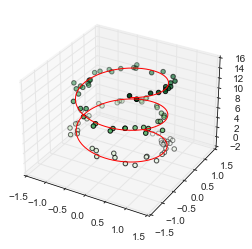

In [67]:
# Three-Dimensional Points and Lines
#we can create these using the ax.plot3D and ax.scatter3D functions.

ax=plt.axes(projection='3d')
# Below are data for a 3D line 

zline=np.linspace(0,15,1000)
yline=np.cos(zline)
xline=np.sin(zline)

ax.plot3D(xline,yline,zline,'red')

## Below are data for 3D scatter plot

zdata = 15 * np.random.random(100)
xdata = np.sin(zdata) + 0.1 * np.random.randn(100)
ydata = np.cos(zdata) + 0.1 * np.random.randn(100)
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens')

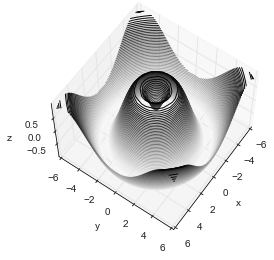

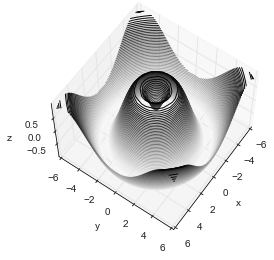

In [68]:
#3D Contour Plots

def f(x,y):
    return np.sin(np.sqrt(x**2+y**2))

x = np.linspace(-6, 6, 30)
y = np.linspace(-6, 6, 30)

X,Y=np.meshgrid(x,y)
Z=f(X,Y)

fig=plt.figure()
ax = plt.axes(projection='3d')
ax.contour3D(X, Y, Z, 50, cmap='binary')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

#If default viewing angle isn't idea, then utilize view_init method to set the elevation and azimuthal angles. 

ax.view_init(60,35)
fig

Text(0.5, 0.92, 'wireframe and Surface Plot')

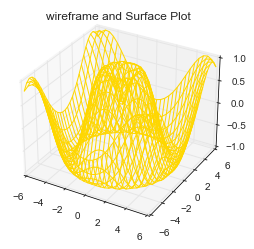

In [69]:
#Wireframes & Surface Plots
fig=plt.figure()
ax = plt.axes(projection='3d')
ax.plot_wireframe(X, Y, Z, color='Gold')
ax.set_title('wireframe and Surface Plot')

Text(0.5, 0.92, 'surface')

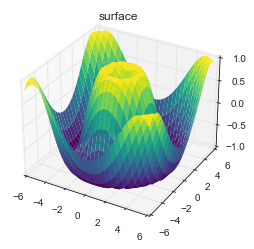

In [70]:
# A surface plot is like a wireframe plot (above), 
# however, each face of the wireframe is a filled polygon. 
# It also has a colormap to the filled polygons can aid perception of the topology of
# the surface being visualized

ax = plt.axes(projection='3d')
ax.plot_surface(X, Y, Z, rstride=1, cstride=1,cmap='viridis', edgecolor='none')
ax.set_title('surface')

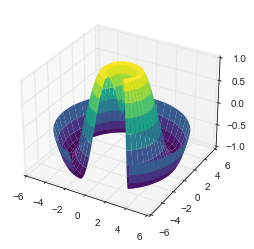

In [71]:
r=np.linspace(0,6,20)
theta = np.linspace(-0.9 * np.pi, 0.8 * np.pi, 40)
r,theta=np.meshgrid(r,theta)
X=r*np.sin(theta)
Y=r*np.cos(theta)
Z=f(X,Y)
ax = plt.axes(projection='3d')
ax.plot_surface(X, Y, Z, rstride=1, cstride=1,cmap='viridis', edgecolor='none')

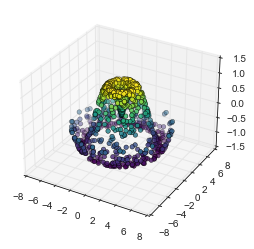

In [72]:
#Surface Triangulations

theta = 2 * np.pi * np.random.random(1000)
r = 6 * np.random.random(1000)
x = np.ravel(r * np.sin(theta))
y = np.ravel(r * np.cos(theta))
z = f(x, y)

# We could create a scatter plot of the points to get an idea of the surface we’re sampling from

ax=plt.axes(projection='3d')
ax.scatter(x,y,z,c=z,cmap='viridis',linewidth=0.5)

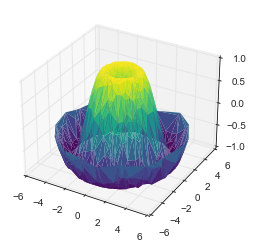

In [73]:
# This function will help us in this case is ax.plot_trisurf, 
# It generates a surface by first finding a set of triangles generated (see the triangles in the shape)
# between adjacent points

ax=plt.axes(projection='3d')
ax.plot_trisurf(x,y,z,cmap='viridis',edgecolor='none')

In [74]:
# triangulate in underlying parameterization

from matplotlib.tri import Triangulation
tri = Triangulation(np.ravel(w), np.ravel(theta))
ax = plt.axes(projection='3d')
ax.plot_trisurf(x, y, z, triangles=tri.triangles,cmap='viridis', linewidths=0.2)
ax.set_xlim(-1, 1); ax.set_ylim(-1, 1); ax.set_zlim(-1, 1)

NameError: name 'w' is not defined

In [101]:
# Iris Petals Dataset (Classic)
#import plotly.express as px
df_iris = px.data.iris()
fig = px.scatter_3d(df_iris, x='sepal_width', y='petal_width', z='sepal_length',
              color='species')
fig.show()

In [ ]:
 
fig = px.scatter_3d(df_tips, x = 'total_bill', 
                    y = 'day', 
                    z = 'time',
                    color = 'sex', 
                    size='tip',
                    size_max = 20,
                    opacity = 0.7)

fig.show()
  

In [ ]:
fig = px.line_3d(gapminder, x="gdpPercap", y="pop", z="year")
fig.show()

## Interactive Plots and some Non-Interactive Scatter Plots

## Scatterplot to view life expectancy vs GDP per Capita

In [ ]:
# Want to query data of 2017
gapminder2007 = gapminder.query('year==2007')
print(gapminder2007)

In [ ]:
# Use included Iris data set
#df_iris = px.data.iris()

px.scatter(df_iris, x="sepal_width", y="sepal_length", color="species",
                 size='petal_length', hover_data=['petal_width'])


fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df_iris.sepal_width, y=df_iris.sepal_length,
    mode='markers',
    marker_color=df_iris.sepal_width,
    text=df_iris.species,
    marker=dict(showscale=True)
))
fig.update_traces(marker_line_width=2, marker_size=10)


fig = go.Figure(data=go.Scattergl(
    x = np.random.randn(100000),
    y = np.random.randn(100000),
    mode='markers',
    marker=dict(
        color=np.random.randn(100000),
        colorscale='Viridis',
        line_width=1
    )
))
fig

In [ ]:
# Strip Charts
df = px.data.gapminder()
df = pd.DataFrame(df)
df = df.groupby(['year','continent'])['pop'].mean().reset_index()
fig = px.strip(df, x="pop", y="year", color="continent", facet_col="continent")
fig.show()

In [ ]:
# Now what if we wanted to color the scatter plot (filter it by color according to continent), we add a color filter
px.scatter(gapminder2007, x='gdpPercap', y= 'lifeExp', color = "continent")
#Notice a legend per color per continent is added
# Note you can filter dots, by clicking on Europe in the legend you Hide European dots
# You can filter more than one continent
# You can unhide by clicking the continent name again

## Bubble Chart to view life expectancy vs GDP per Capita

In [79]:
# Now we wanna animate the facet plot above for a year-by-year animation of the facet plot above

px.scatter(gapminder, x= 'gdpPercap', y='lifeExp', color = 'continent', size = 'pop', 
          size_max = 60, hover_name = 'country', facet_col= 'continent', log_x = True, animation_frame = "year")



### Animated Figures with Plotly Express

In [80]:
# Now animated whole graph -  not facet or multi-column graph
# So we remove facet_col
px.scatter(gapminder, x= 'gdpPercap', y='lifeExp', color = 'continent', size = 'pop', 
          size_max = 60, hover_name = 'country', log_x = True, 
           animation_frame = "year", 
           range_x = [25, 10000],
          range_y = [25, 90])

In [81]:
#Scatter Plots
df = px.data.gapminder()
fig = px.scatter(df,x="pop", y="gdpPercap",
                 color="continent",
                 size='pop', hover_data=['country'],
                 title = 'Year-Population corellation')
fig.show()

### Boxplots

In [ ]:
# Boxplot
df = px.data.gapminder().query("year == 2007")
# Here we use a column with categorical data
fig = px.box(df, x="continent", y="gdpPercap")
fig.show()

## Pie Charts and Sunburst Charts

In [ ]:
#Pie Chart
df_samer = px.data.gapminder().query("year == 2007").query("continent == 'Europe'")
px.pie(df_samer, values='pop', names='country', 
       title='Population of Asian continent', 
       color_discrete_sequence=px.colors.sequential.RdBu)

# Customize pie chart
colors = ['blue', 'green', 'black', 'purple', 'red', 'brown']
fig = go.Figure(data=[go.Pie(labels=['Water','Grass','Normal','Psychic', 'Fire', 'Ground'], 
                       values=[110,90,80,80,70,60])])
# Define hover info, text size, pull amount for each pie slice, and stroke
fig.update_traces(hoverinfo='label+percent', textfont_size=20,
                  textinfo='label+percent', pull=[0.1, 0, 0.2, 0, 0, 0],
                  marker=dict(colors=colors, line=dict(color='#FFFFFF', width=2)))

In [ ]:
# Sunburst of a rectangular DataFrame with discrete color argument in
# There are more then one variant of these chart i like the below one as this is more interactive
df = px.data.gapminder().query("year == 2007")
fig = px.sunburst(df, path=['continent','country','year'], values='pop', color='country',
                 color_discrete_map={'(?)':'black', 'India':'gold', 'China':'darkblue'})
fig.show()

In [ ]:
# Pie chart
df = px.data.gapminder().query("year == 2007").query("continent == 'Africa'")
df.loc[df['pop'] < 2.e6, 'country'] = 'Other countries' # Represent only large countries
fig = px.pie(df, values='pop', names='country', title='Population of Africa continent')
fig.show()

## Violin Plots

In [ ]:
# Violin Plot is hybrid of KDE and boxplot
# box plots are set according to data points, 
# violin plot are set by KDE estimation
# of the data points
df_tips = px.data.tips()
px.violin(df_tips, y="total_bill", box=True, points='all')

# plotting several plots
px.violin(df_tips, y="tip", x="smoker", color="sex", box=True, points="all",
          hover_data=df_tips.columns)

# Changing violin plots left or right based on if the client is a smoker
fig = go.Figure()
fig.add_trace(go.Violin(x=df_tips['day'][ df_tips['smoker'] == 'Yes' ],
                        y=df_tips['total_bill'][ df_tips['smoker'] == 'Yes' ],
                        legendgroup='Yes', scalegroup='Yes', name='Yes',
                        side='negative',
                        line_color='blue'))
fig.add_trace(go.Violin(x=df_tips['day'][ df_tips['smoker'] == 'No' ],
                        y=df_tips['total_bill'][ df_tips['smoker'] == 'No' ],
                        legendgroup='Yes', scalegroup='Yes', name='No',
                        side='positive',
                        line_color='red'))

In [ ]:
# Simple Violin Plot
df = px.data.gapminder()
fig = px.violin(df, y="lifeExp")
fig.show()

## Tree Maps and Heatmaps

In [ ]:
# Treemap Charts
df = px.data.gapminder().query("year == 2007")
fig = px.treemap(df, path=['continent','country','year'], values='pop', color='country',
                 color_discrete_map={'(?)':'black', 'Brazil':'gold', 'Japan':'darkblue'})
fig.show()

In [ ]:
#Heatmap, Unequal Boxes and Golden Ratio Spiral

#import plotly.graph_objects as go
#import numpy as np

# Generate rectangles for heatmap
# heatmap edges to be squares
phi = (1 + np.sqrt(5) )/2. # golden ratio or fibonacci sequence
xe = [0, 1, 1+(1/(phi**4)), 1+(1/(phi**3)), phi]
ye = [0, 1/(phi**3), 1/phi**3+1/phi**4, 1/(phi**2), 1]

z = [ [13,3,3,5],
      [13,2,1,5],
      [13,10,11,12],
      [13,8,8,8]
    ]

fig = go.Figure(data=go.Heatmap(
          x = np.sort(xe),
          y = np.sort(ye),
          z = z,
          type = 'heatmap',
          colorscale = 'Plasma'))

# Add spiral line plot

def spiral(th):
    a = 1.120529
    b = 0.306349
    r = a*np.exp(-b*th)
    return (r*np.cos(th), r*np.sin(th))

theta = np.linspace(-np.pi/13,4*np.pi,1000); # angle
(x,y) = spiral(theta)

fig.add_trace(go.Scatter(x= -x+x[0], y= y-y[0],
     line =dict(color='white',width=3)))

axis_template = dict(range = [0,1.6], autorange = False,
             showgrid = False, zeroline = False,
             linecolor = 'black', showticklabels = False,
             ticks = '' )

fig.update_layout(margin = dict(t=200,r=200,b=200,l=200),
    xaxis = axis_template,
    yaxis = axis_template,
    showlegend = False,
    width = 700, height = 700,
    autosize = False )

fig.show()

## Filled Area Plot

In [ ]:
df = px.data.gapminder() # Viewing data for using below
print(df)

In [ ]:
# Filled Area  #using buily-in dataset
#gapminder = px.data.gapminder()
fig = px.area(gapminder, x="year", y="gdpPercap", color="continent",line_group="country")
fig.show()

## Ternary Plot

In [ ]:
df_experiment = px.data.experiment() #Viewing dataset for usage below - built-in
print(df_exp)

In [ ]:
# Ternary Plot
# It's purpose is to show ratios of 3 categories
df_experiment = px.data.experiment()
px.scatter_ternary(df_experiment, a="experiment_1", b="experiment_2", 
                   c='experiment_3', hover_name="gender", color="group")

## Gantt Chart

In [ ]:
# Gantt Charts
df = pd.DataFrame([
    dict(Task="Job A", Start='2020-01-01', Finish='2020-02-28', Resource="Cleopatra"),
    dict(Task="Job B", Start='2020-03-05', Finish='2020-04-15', Resource="Mark"),
    dict(Task="Job C", Start='2020-02-20', Finish='2020-05-30', Resource="Caesar")
])

fig = px.timeline(df, x_start="Start", x_end="Finish", y="Resource", color="Resource")
fig.show()

## Polar Chart

In [ ]:
# Polar charts display data (in a radius) radially 
df_winddata = px.data.wind()
px.scatter_polar(df_winddata, r="frequency", theta="direction", color="strength",
                size="frequency", symbol="strength")


px.line_polar(df_wind, r="frequency", theta="direction", color="strength",
                line_close=True, template="plotly_dark", width=800, height=400)

## Equations

In [ ]:
# at the top, import the following:
#from matplotlib import pyplot as plt
#import numpy as np
#import matplotlib


X = np.linspace(3, 8, 800)
Y = X
Y2 = X**3
Y_log = np.log(X)
Y_cos = np.cos(np.pi*X)

matplotlib.rcParams['font.size'] = 20

plt.plot(X, Y2, X, Y, X, Y_log)
plt.xlabel('$x \in [1, \infty)$', fontsize=14)
plt.ylabel('$y$',fontsize=14)
plt.legend(['$y=x^2$', '$y=x$', '$y=\ln\;x$'], fontsize=12)
plt.title('Comparison of $\mathcal{O}(x^2)$, $\mathcal{O}(x)$, and $\mathcal{O}(\ln\;x)$', fontsize=16)
plt.text(3.4, 8, 'Rapid growth\nwhen $y \sim \mathcal{O}(x^2)$', fontsize=14, color='gray')

ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False);

In [ ]:
plt.plot(X, Y2)
plt.title(r'$y=x^2$');

In [ ]:
# Symbols and Sub/Superscripts
plt.plot(X, Y)
plt.title(r'$y=x_i$');

In [ ]:
# Symbols and Sub/Superscripts
plt.plot(X, Y)
plt.title(r'$y=x_{base}$');   

In [ ]:
plt.plot(X, Y_cos)
plt.title(r'$y=\cos(\pi x)$')
plt.text(2.8, 1.25, r'$y=\cos(\pi x)$')
plt.xlabel(r'$y=\cos(\pi x)$')
plt.ylabel(r'$y=\cos(\pi x)$')
plt.legend([r'$y=\cos(\pi x)$'], loc=4); 

## Fractions and Formulas

In [ ]:
x = np.linspace(0.5, 100, 1000)
y_frac = 2 + 1/(x**2);

### Fractions

In [ ]:
plt.plot(x, y_frac)
plt.ylim(0, None)
plt.text(40, 4, r'$\lim_{x\rightarrow\infty}\;2 + \frac{1}{x^2} = 2$', fontsize=20);

### Accent Marks

In [ ]:
plt.plot(X, Y_log)
plt.title(r'$\ddot{U}$ber is German for Super');

## 3D Parametric Plot

In [ ]:
import chart_studio.plotly as py
import plotly.graph_objects as go

import numpy as np

s = np.linspace(0, 2 * np.pi, 240)
t = np.linspace(0, np.pi, 240)
tGrid, sGrid = np.meshgrid(s, t)

r = 2 + np.sin(7 * sGrid + 5 * tGrid)  # r = 2 + sin(7s+5t)
x = r * np.cos(sGrid) * np.sin(tGrid)  # x = r*cos(s)*sin(t)
y = r * np.sin(sGrid) * np.sin(tGrid)  # y = r*sin(s)*sin(t)
z = r * np.cos(tGrid)                  # z = r*cos(t)

surface = go.Surface(x=x, y=y, z=z)
data = [surface]

layout = go.Layout(
    title='Parametric Plot',
    scene=dict(
        xaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        yaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        zaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        )
    )
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='jupyter-parametric_plot')

## Animated figures in Dash

In [89]:
#Run  this in Pycharm and click the URL and it works

import dash
from dash import dcc
from dash import html
from dash.dependencies import Input, Output
import plotly.express as px

df = px.data.gapminder()
animations = {
    'Scatter': px.scatter(
        df, x="gdpPercap", y="lifeExp", animation_frame="year", 
        animation_group="country", size="pop", color="continent", 
        hover_name="country", log_x=True, size_max=55, 
        range_x=[100,100000], range_y=[25,90]),
    'Bar': px.bar(
        df, x="continent", y="pop", color="continent", 
        animation_frame="year", animation_group="country", 
        range_y=[0,4000000000]),
}

app = dash.Dash(__name__)

app.layout = html.Div([
    html.P("Select an animation:"),
    dcc.RadioItems(
        id='selection',
        options=[{'label': x, 'value': x} for x in animations],
        value='Scatter'
    ),
    dcc.Graph(id="graph"),
])

@app.callback(
    Output("graph", "figure"), 
    [Input("selection", "value")])
def display_animated_graph(s):
    return animations[s]

app.run_server(debug=True)



Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

Dash is running on http://127.0.0.1:8050/

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: on


SystemExit: 1

## Animated Bar Chart with Plotly Express

In [91]:
import plotly.express as px

df = px.data.gapminder()

fig = px.bar(df, x="continent", y="pop", color="continent",
  animation_frame="year", animation_group="country", range_y=[0,4000000000])
fig.show()

## Simple Play Button

In [93]:
import plotly.graph_objects as go

fig = go.Figure(
    data=[go.Scatter(x=[0, 1], y=[0, 1])],
    layout=go.Layout(
        xaxis=dict(range=[0, 5], autorange=False),
        yaxis=dict(range=[0, 5], autorange=False),
        title="Start Title",
        updatemenus=[dict(
            type="buttons",
            buttons=[dict(label="Play",
                          method="animate",
                          args=[None])])]
    ),
    frames=[go.Frame(data=[go.Scatter(x=[1, 2], y=[1, 2])]),
            go.Frame(data=[go.Scatter(x=[1, 4], y=[1, 4])]),
            go.Frame(data=[go.Scatter(x=[3, 4], y=[3, 4])],
                     layout=go.Layout(title_text="End Title"))]
)

fig.show()

## Moving Point on a Curve

In [94]:
import plotly.graph_objects as go

import numpy as np

# Generate curve data
t = np.linspace(-1, 1, 100)
x = t + t ** 2
y = t - t ** 2
xm = np.min(x) - 1.5
xM = np.max(x) + 1.5
ym = np.min(y) - 1.5
yM = np.max(y) + 1.5
N = 50
s = np.linspace(-1, 1, N)
xx = s + s ** 2
yy = s - s ** 2


# Create figure
fig = go.Figure(
    data=[go.Scatter(x=x, y=y,
                     mode="lines",
                     line=dict(width=2, color="blue")),
          go.Scatter(x=x, y=y,
                     mode="lines",
                     line=dict(width=2, color="blue"))],
    layout=go.Layout(
        xaxis=dict(range=[xm, xM], autorange=False, zeroline=False),
        yaxis=dict(range=[ym, yM], autorange=False, zeroline=False),
        title_text="Kinematic Generation of a Planar Curve", hovermode="closest",
        updatemenus=[dict(type="buttons",
                          buttons=[dict(label="Play",
                                        method="animate",
                                        args=[None])])]),
    frames=[go.Frame(
        data=[go.Scatter(
            x=[xx[k]],
            y=[yy[k]],
            mode="markers",
            marker=dict(color="red", size=10))])

        for k in range(N)]
)

fig.show()


## Moving Frenet Frame Along a Planar Curve

In [95]:
import plotly.graph_objects as go

import numpy as np


# Generate curve data
t = np.linspace(-1, 1, 100)
x = t + t ** 2
y = t - t ** 2
xm = np.min(x) - 1.5
xM = np.max(x) + 1.5
ym = np.min(y) - 1.5
yM = np.max(y) + 1.5
N = 50
s = np.linspace(-1, 1, N)
xx = s + s ** 2
yy = s - s ** 2
vx = 1 + 2 * s
vy = 1 - 2 * s  # v=(vx, vy) is the velocity
speed = np.sqrt(vx ** 2 + vy ** 2)
ux = vx / speed  # (ux, uy) unit tangent vector, (-uy, ux) unit normal vector
uy = vy / speed

xend = xx + ux  # end coordinates for the unit tangent vector at (xx, yy)
yend = yy + uy

xnoe = xx - uy  # end coordinates for the unit normal vector at (xx,yy)
ynoe = yy + ux


# Create figure
fig = go.Figure(
    data=[go.Scatter(x=x, y=y,
                     name="frame",
                     mode="lines",
                     line=dict(width=2, color="blue")),
          go.Scatter(x=x, y=y,
                     name="curve",
                     mode="lines",
                     line=dict(width=2, color="blue"))
          ],
    layout=go.Layout(width=600, height=600,
                     xaxis=dict(range=[xm, xM], autorange=False, zeroline=False),
                     yaxis=dict(range=[ym, yM], autorange=False, zeroline=False),
                     title="Moving Frenet Frame Along a Planar Curve",
                     hovermode="closest",
                     updatemenus=[dict(type="buttons",
                                       buttons=[dict(label="Play",
                                                     method="animate",
                                                     args=[None])])]),

    frames=[go.Frame(
        data=[go.Scatter(
            x=[xx[k], xend[k], None, xx[k], xnoe[k]],
            y=[yy[k], yend[k], None, yy[k], ynoe[k]],
            mode="lines",
            line=dict(color="red", width=2))
        ]) for k in range(N)]
)

fig.show()

## Using a Slider and Buttons

In [96]:
import plotly.graph_objects as go

import pandas as pd

url = "https://raw.githubusercontent.com/plotly/datasets/master/gapminderDataFiveYear.csv"
dataset = pd.read_csv(url)

years = ["1952", "1962", "1967", "1972", "1977", "1982", "1987", "1992", "1997", "2002",
         "2007"]

# make list of continents
continents = []
for continent in dataset["continent"]:
    if continent not in continents:
        continents.append(continent)
# make figure
fig_dict = {
    "data": [],
    "layout": {},
    "frames": []
}

# fill in most of layout
fig_dict["layout"]["xaxis"] = {"range": [30, 85], "title": "Life Expectancy"}
fig_dict["layout"]["yaxis"] = {"title": "GDP per Capita", "type": "log"}
fig_dict["layout"]["hovermode"] = "closest"
fig_dict["layout"]["updatemenus"] = [
    {
        "buttons": [
            {
                "args": [None, {"frame": {"duration": 500, "redraw": False},
                                "fromcurrent": True, "transition": {"duration": 300,
                                                                    "easing": "quadratic-in-out"}}],
                "label": "Play",
                "method": "animate"
            },
            {
                "args": [[None], {"frame": {"duration": 0, "redraw": False},
                                  "mode": "immediate",
                                  "transition": {"duration": 0}}],
                "label": "Pause",
                "method": "animate"
            }
        ],
        "direction": "left",
        "pad": {"r": 10, "t": 87},
        "showactive": False,
        "type": "buttons",
        "x": 0.1,
        "xanchor": "right",
        "y": 0,
        "yanchor": "top"
    }
]

sliders_dict = {
    "active": 0,
    "yanchor": "top",
    "xanchor": "left",
    "currentvalue": {
        "font": {"size": 20},
        "prefix": "Year:",
        "visible": True,
        "xanchor": "right"
    },
    "transition": {"duration": 300, "easing": "cubic-in-out"},
    "pad": {"b": 10, "t": 50},
    "len": 0.9,
    "x": 0.1,
    "y": 0,
    "steps": []
}

# make data
year = 1952
for continent in continents:
    dataset_by_year = dataset[dataset["year"] == year]
    dataset_by_year_and_cont = dataset_by_year[
        dataset_by_year["continent"] == continent]

    data_dict = {
        "x": list(dataset_by_year_and_cont["lifeExp"]),
        "y": list(dataset_by_year_and_cont["gdpPercap"]),
        "mode": "markers",
        "text": list(dataset_by_year_and_cont["country"]),
        "marker": {
            "sizemode": "area",
            "sizeref": 200000,
            "size": list(dataset_by_year_and_cont["pop"])
        },
        "name": continent
    }
    fig_dict["data"].append(data_dict)

# make frames
for year in years:
    frame = {"data": [], "name": str(year)}
    for continent in continents:
        dataset_by_year = dataset[dataset["year"] == int(year)]
        dataset_by_year_and_cont = dataset_by_year[
            dataset_by_year["continent"] == continent]

        data_dict = {
            "x": list(dataset_by_year_and_cont["lifeExp"]),
            "y": list(dataset_by_year_and_cont["gdpPercap"]),
            "mode": "markers",
            "text": list(dataset_by_year_and_cont["country"]),
            "marker": {
                "sizemode": "area",
                "sizeref": 200000,
                "size": list(dataset_by_year_and_cont["pop"])
            },
            "name": continent
        }
        frame["data"].append(data_dict)

    fig_dict["frames"].append(frame)
    slider_step = {"args": [
        [year],
        {"frame": {"duration": 300, "redraw": False},
         "mode": "immediate",
         "transition": {"duration": 300}}
    ],
        "label": year,
        "method": "animate"}
    sliders_dict["steps"].append(slider_step)


fig_dict["layout"]["sliders"] = [sliders_dict]

fig = go.Figure(fig_dict)

fig.show()
